<a href="https://colab.research.google.com/github/minabeigi2026-ship-it/LymphomaClassifier/blob/main/k_fold_crossevaluation_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Your Python code

      ↓

openslide-python  (pip install — Python wrapper)

      ↓

openslide-tools   (apt-get install — C library)

      ↓

SVS file on disk

import openslide just loads an already-installed package into the current Python session's memory so you can use it. If the package isn't installed, import fails. If the C library isn't installed, import also fails even if the Python package is there.

Colab resets everything between sessions — both the OS-level libraries and the Python packages. That's why we need to reinstall everything each time. The order must be:


1. apt-get install openslide-tools   ← install C library into OS
2. pip install openslide-python      ← install Python wrapper
3. import openslide                  ← load into current session


Skipping step 1 or running step 3 before step 2 causes the errors we've been seeing. Using subprocess.run in our new startup cell ensures step 1 completes fully before Python even starts loading packages.

In [15]:
# ============================================================
# LYMPHOMA CLASSIFIER — FULL SESSION STARTUP
# Run this single cell to restore the entire environment
# ============================================================

# --- 1. System installs first ---
import subprocess
subprocess.run(["apt-get", "install", "-y", "openslide-tools"],
               capture_output=True)

# --- 2. Pip installs ---
import sys
subprocess.run([sys.executable, "-m", "pip", "install",
                "openslide-python", "torchstain", "scikit-learn",
                "seaborn", "-q"], capture_output=True)

print("System dependencies installed.")

# --- 3. Mount Drive ---
from google.colab import drive
drive.mount('/content/drive')

# --- 4. All imports ---
import os
import io
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
from PIL import Image
from collections import defaultdict
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import cv2
import torchstain
import openslide
import requests
from IPython.display import display as ipy_display

print("All imports successful.")

# --- 5. Config ---
BASE_DIR      = "/content/drive/MyDrive/lymphoma_classifier"
PATCH_DIR     = f"{BASE_DIR}/patches"
NORM_PATCH_DIR = f"{BASE_DIR}/patches_normalised"
DOWNLOAD_URL  = "https://api.gdc.cancer.gov/data/"
PATCH_SIZE    = 256
LEVEL         = 1
TISSUE_THRESHOLD = 0.7
PATCHES_PER_SLIDE = 200
BATCH_SIZE    = 32
NUM_EPOCHS    = 10
LEARNING_RATE = 1e-4
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Device: {DEVICE}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# --- 6. Transforms ---
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(90),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

to_tensor_255 = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x * 255)
])

# --- 7. Dataset class ---
class PatchDataset(Dataset):
    def __init__(self, samples, transform=None):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        image = Image.open(path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# --- 8. Model ---
def build_model():
    model = models.resnet18(weights="IMAGENET1K_V1")
    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, 2)
    return model.to(DEVICE)

# --- 9. Training and evaluation ---
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for images, labels in tqdm(loader, leave=False):
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)
    return total_loss / len(loader), correct / total

def evaluate(model, loader, criterion):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)
    return total_loss / len(loader), correct / total

# --- 10. Tiling functions ---
def is_tissue(patch, threshold=TISSUE_THRESHOLD):
    gray = np.array(patch.convert("L"))
    white_pixels = np.sum(gray > 220)
    total_pixels = gray.size
    return (white_pixels / total_pixels) < threshold

def tile_slide(slide_path, output_dir, label, patches_per_slide=PATCHES_PER_SLIDE):
    slide_name = os.path.splitext(os.path.basename(slide_path))[0]
    os.makedirs(output_dir, exist_ok=True)
    existing = [f for f in os.listdir(output_dir) if f.startswith(slide_name)]
    if len(existing) >= patches_per_slide:
        print(f"  Already tiled: {slide_name[:50]} ({len(existing)} patches)")
        return len(existing)
    slide = openslide.OpenSlide(slide_path)
    level = min(LEVEL, slide.level_count - 1)
    w, h = slide.level_dimensions[level]
    cols = w // PATCH_SIZE
    rows = h // PATCH_SIZE
    saved = 0
    positions = [(r, c) for r in range(rows) for c in range(cols)]
    np.random.shuffle(positions)
    for (row, col) in positions:
        if saved >= patches_per_slide:
            break
        x = col * PATCH_SIZE
        y = row * PATCH_SIZE
        scale = slide.level_downsamples[level]
        patch = slide.read_region(
            location=(int(x * scale), int(y * scale)),
            level=level,
            size=(PATCH_SIZE, PATCH_SIZE)
        ).convert("RGB")
        if not is_tissue(patch):
            continue
        patch_name = f"{slide_name}_r{row:04d}_c{col:04d}.png"
        patch.save(os.path.join(output_dir, patch_name))
        saved += 1
    slide.close()
    return saved

# --- 11. Download function ---
def download_slide(file_id, file_name, label, base_dir):
    dest_dir = os.path.join(base_dir, "slides", label)
    dest_path = os.path.join(dest_dir, file_name)
    if os.path.exists(dest_path) and os.path.getsize(dest_path) > 0:
        print(f"  Already exists, skipping: {file_name[:60]}")
        return True
    url = DOWNLOAD_URL + file_id
    try:
        response = requests.get(url, stream=True, timeout=300)
        response.raise_for_status()
        total_size = int(response.headers.get("content-length", 0))
        with open(dest_path, "wb") as f, tqdm(
            desc=file_name[:50], total=total_size,
            unit="B", unit_scale=True, unit_divisor=1024, leave=False
        ) as bar:
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
                bar.update(len(chunk))
        return True
    except Exception as e:
        print(f"  Failed: {file_name} — {e}")
        if os.path.exists(dest_path):
            os.remove(dest_path)
        return False

# --- 12. Normalisation function ---
def normalise_and_save(patch_path, output_dir, normalizer, to_tensor):
    fname = os.path.basename(patch_path)
    out_path = os.path.join(output_dir, fname)
    if os.path.exists(out_path):
        return "skipped"
    img = Image.open(patch_path).convert("RGB")
    img_tensor = to_tensor(img)
    try:
        result = normalizer.normalize(img_tensor)
        norm_np = result[0].clamp(0, 255).byte().numpy()
        Image.fromarray(norm_np).save(out_path)
        return "normalised"
    except Exception:
        img.save(out_path)
        return "fallback"

# --- 13. Helper functions ---
def get_slide_id(fname):
    name = fname.replace(".png", "")
    parts = name.split("_")
    return "_".join(parts[:-2])

def get_institution(slide_id):
    return "tcga" if slide_id.startswith("TCGA") else "cgci"

# --- 14. GradCAM ---
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.activations = None
        target_layer = model.layer4[-1]
        target_layer.register_forward_hook(self._save_activations)
        target_layer.register_full_backward_hook(self._save_gradients)

    def _save_activations(self, module, input, output):
        self.activations = output.detach()

    def _save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, class_idx=None):
        self.model.eval()
        output = self.model(input_tensor.unsqueeze(0).to(DEVICE))
        if class_idx is None:
            class_idx = output.argmax(1).item()
        self.model.zero_grad()
        output[0, class_idx].backward()
        weights = self.gradients.mean(dim=[2, 3], keepdim=True)
        cam = (weights * self.activations).sum(dim=1).squeeze()
        cam = torch.relu(cam).cpu().numpy()
        if cam.max() > 0:
            cam = cam / cam.max()
        cam = cv2.resize(cam, (256, 256))
        return cam, class_idx

def visualise_gradcam_fixed(model, samples, class_names, n_samples=8, save_path=None):
    gradcam = GradCAM(model)
    indices = np.random.choice(len(samples), size=min(n_samples, len(samples)), replace=False)
    fig, axes = plt.subplots(len(indices), 3, figsize=(12, 4 * len(indices)))
    if len(indices) == 1:
        axes = axes[np.newaxis, :]
    axes[0, 0].set_title("Original Patch", fontsize=13, fontweight="bold")
    axes[0, 1].set_title("GradCAM Heatmap", fontsize=13, fontweight="bold")
    axes[0, 2].set_title("Overlay", fontsize=13, fontweight="bold")
    for row, idx in enumerate(indices):
        patch_path, true_label = samples[idx]
        image = Image.open(patch_path).convert("RGB")
        input_tensor = val_test_transform(image)
        cam, pred_label = gradcam.generate(input_tensor)
        img_np = np.array(image)
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)
        axes[row, 0].imshow(img_np)
        axes[row, 0].axis("off")
        axes[row, 1].imshow(heatmap)
        axes[row, 1].axis("off")
        axes[row, 2].imshow(overlay)
        axes[row, 2].axis("off")
        correct = "✓" if pred_label == true_label else "✗"
        axes[row, 0].set_ylabel(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]} {correct}",
            fontsize=9, rotation=0, labelpad=120, va="center"
        )
    plt.suptitle("GradCAM — What the model looks at", fontsize=15, fontweight="bold", y=1.01)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=150)
        size_kb = os.path.getsize(save_path) / 1024
        print(f"Saved to {save_path} ({size_kb:.1f} KB)")
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches="tight", dpi=150)
    buf.seek(0)
    plt.close(fig)
    ipy_display(Image.open(buf))

print("\n✓ All functions and classes defined!")
print("✓ Session fully restored — ready to go!")

System dependencies installed.
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
All imports successful.
Device: cuda
GPU: Tesla T4

✓ All functions and classes defined!
✓ Session fully restored — ready to go!


In [10]:
#Rebuild slide-level splits from normalised patches
# Build slide -> patches mapping from normalised folder
slide_to_patches_norm = defaultdict(list)
label_map = {"burkitt": 0, "dlbcl": 1}

for label_name, label_idx in label_map.items():
    folder = os.path.join(NORM_PATCH_DIR, label_name)
    for fname in os.listdir(folder):
        if fname.endswith(".png"):
            slide_id = get_slide_id(fname)
            patch_path = os.path.join(folder, fname)
            slide_to_patches_norm[slide_id].append((patch_path, label_idx))

print(f"Total slides: {len(slide_to_patches_norm)}")
print(f"Total patches: {sum(len(v) for v in slide_to_patches_norm.values())}")

# Rebuild same slide-level split using same seed as before
np.random.seed(42)

burkitt_slides = sorted([s for s in slide_to_patches_norm if slide_to_patches_norm[s][0][1] == 0])
dlbcl_slides   = sorted([s for s in slide_to_patches_norm if slide_to_patches_norm[s][0][1] == 1])

def split_slides(slides, train_ratio=0.7, val_ratio=0.15):
    slides = list(slides)
    np.random.shuffle(slides)
    n = len(slides)
    n_train = int(n * train_ratio)
    n_val   = int(n * val_ratio)
    return slides[:n_train], slides[n_train:n_train+n_val], slides[n_train+n_val:]

burkitt_train, burkitt_val, burkitt_test = split_slides(burkitt_slides)
dlbcl_train,   dlbcl_val,   dlbcl_test   = split_slides(dlbcl_slides)

def slides_to_samples(slide_list):
    samples = []
    for slide_id in slide_list:
        samples.extend(slide_to_patches_norm[slide_id])
    return samples

train_samples_norm = slides_to_samples(burkitt_train + dlbcl_train)
val_samples_norm   = slides_to_samples(burkitt_val   + dlbcl_val)
test_samples_norm  = slides_to_samples(burkitt_test  + dlbcl_test)

np.random.shuffle(train_samples_norm)
np.random.shuffle(val_samples_norm)
np.random.shuffle(test_samples_norm)

print(f"\nTrain: {len(train_samples_norm)} patches")
print(f"Val:   {len(val_samples_norm)} patches")
print(f"Test:  {len(test_samples_norm)} patches")

# Leakage check
train_ids = set(get_slide_id(os.path.basename(p)) for p, _ in train_samples_norm)
val_ids   = set(get_slide_id(os.path.basename(p)) for p, _ in val_samples_norm)
test_ids  = set(get_slide_id(os.path.basename(p)) for p, _ in test_samples_norm)
print(f"\nLeakage check:")
print(f"  Train ∩ Val:  {len(train_ids & val_ids)} (should be 0)")
print(f"  Train ∩ Test: {len(train_ids & test_ids)} (should be 0)")
print(f"  Val ∩ Test:   {len(val_ids & test_ids)} (should be 0)")

KeyboardInterrupt: 

In [ ]:
# Load best model and verify
# Build dataloaders
train_dataset = PatchDataset(train_samples_norm, transform=train_transform)
val_dataset   = PatchDataset(val_samples_norm,   transform=val_test_transform)
test_dataset  = PatchDataset(test_samples_norm,  transform=val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# Load best model
criterion = nn.CrossEntropyLoss()
model = build_model()
model.load_state_dict(torch.load(f"{BASE_DIR}/best_model_normalised.pth", map_location=DEVICE))
model.eval()

# Quick sanity check on val set
val_loss, val_acc = evaluate(model, val_loader, criterion)
print(f"Val accuracy (should be ~86%): {val_acc:.4f}")
print(f"\nReady to go!")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 211MB/s]


Val accuracy (should be ~86%): 0.7183

Ready to go!


=== GradCAM — Normalised model (v3) ===
Saved to /content/drive/MyDrive/lymphoma_classifier/gradcam_normalised_fixed.png (9765.8 KB)


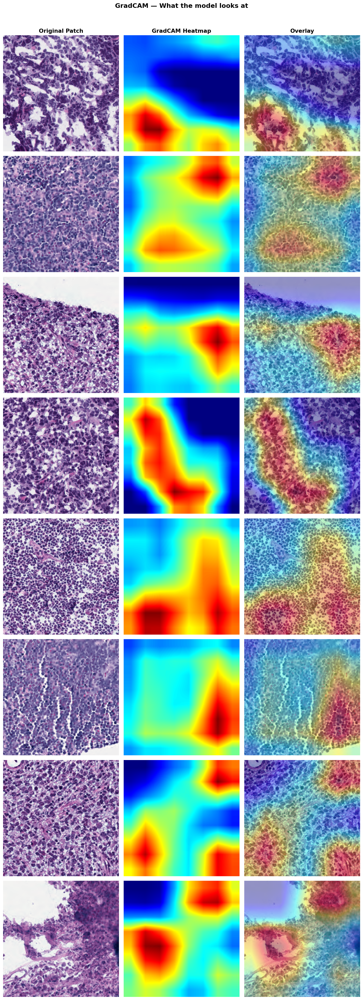

In [ ]:
# Fixed GradCAM visualisation — resolves black figure issue in Colab
from IPython.display import display as ipy_display
import io

def visualise_gradcam_fixed(model, samples, class_names, n_samples=8, save_path=None):
    gradcam = GradCAM(model)
    indices = np.random.choice(len(samples), size=min(n_samples, len(samples)), replace=False)

    fig, axes = plt.subplots(len(indices), 3, figsize=(12, 4 * len(indices)))
    if len(indices) == 1:
        axes = axes[np.newaxis, :]

    axes[0, 0].set_title("Original Patch", fontsize=13, fontweight="bold")
    axes[0, 1].set_title("GradCAM Heatmap", fontsize=13, fontweight="bold")
    axes[0, 2].set_title("Overlay", fontsize=13, fontweight="bold")

    for row, idx in enumerate(indices):
        patch_path, true_label = samples[idx]
        image = Image.open(patch_path).convert("RGB")
        input_tensor = val_test_transform(image)
        cam, pred_label = gradcam.generate(input_tensor)
        img_np = np.array(image)
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)

        axes[row, 0].imshow(img_np)
        axes[row, 0].axis("off")
        axes[row, 1].imshow(heatmap)
        axes[row, 1].axis("off")
        axes[row, 2].imshow(overlay)
        axes[row, 2].axis("off")

        correct = "✓" if pred_label == true_label else "✗"
        axes[row, 0].set_ylabel(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]} {correct}",
            fontsize=9, rotation=0, labelpad=120, va="center"
        )

    plt.suptitle("GradCAM — What the model looks at", fontsize=15, fontweight="bold", y=1.01)
    plt.tight_layout()

    # Fix — save to buffer first, then display
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=150)
        # Verify file was written correctly
        size_kb = os.path.getsize(save_path) / 1024
        print(f"Saved to {save_path} ({size_kb:.1f} KB)")
        if size_kb < 10:
            print("WARNING — file is suspiciously small, may be blank!")

    # Display inline using buffer
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches="tight", dpi=150)
    buf.seek(0)
    plt.close(fig)  # close to free memory
    ipy_display(Image.open(buf))

# Run on normalised model test set
class_names = {0: "Burkitt", 1: "DLBCL"}

print("=== GradCAM — Normalised model (v3) ===")
visualise_gradcam_fixed(
    model, test_samples_norm, class_names,
    n_samples=8,
    save_path=f"{BASE_DIR}/gradcam_normalised_fixed.png"
)

Test Loss:     7.7481
Test Accuracy: 0.5435


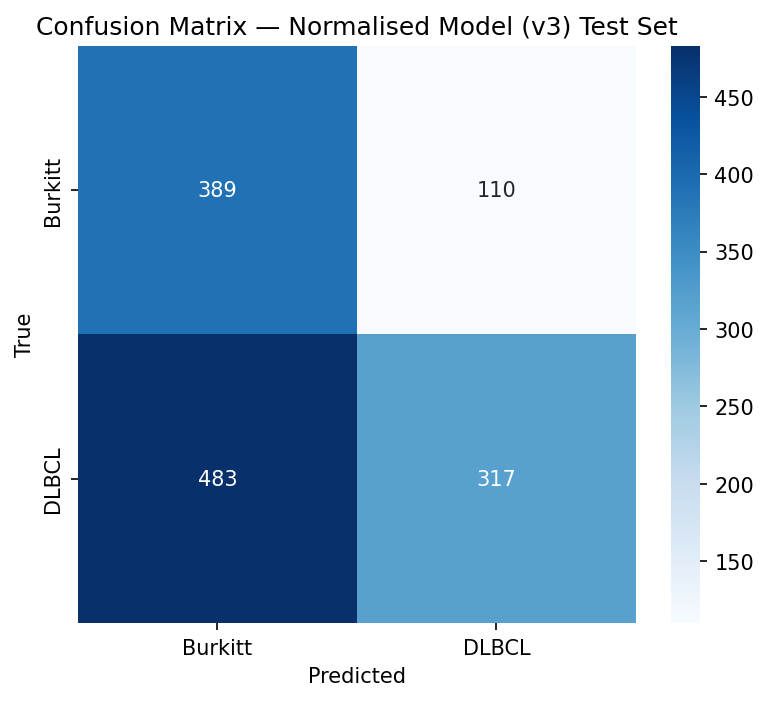

              precision    recall  f1-score   support

     Burkitt       0.45      0.78      0.57       499
       DLBCL       0.74      0.40      0.52       800

    accuracy                           0.54      1299
   macro avg       0.59      0.59      0.54      1299
weighted avg       0.63      0.54      0.54      1299



In [ ]:
# Test set evaluation on normalised model (v3)
model.load_state_dict(torch.load(f"{BASE_DIR}/best_model_normalised.pth", map_location=DEVICE))
model.eval()

criterion = nn.CrossEntropyLoss()
test_loss, test_acc = evaluate(model, test_loader, criterion)
print(f"Test Loss:     {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

# Collect all predictions
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        preds = model(images).argmax(1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Burkitt", "DLBCL"],
            yticklabels=["Burkitt", "DLBCL"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix — Normalised Model (v3) Test Set")

buf = io.BytesIO()
plt.savefig(buf, format='png', bbox_inches="tight", dpi=150)
buf.seek(0)
plt.close()
ipy_display(Image.open(buf))

# Classification report
print(classification_report(all_labels, all_preds, target_names=["Burkitt", "DLBCL"]))

In [6]:
#rerun in each session
import requests
import json
import pandas as pd

endpoint = "https://api.gdc.cancer.gov/files"

# Check what DLBCL slides are available from CGCI
# and what other projects have Burkitt slides
filters_dlbcl_cgci = {
    "op": "and",
    "content": [
        {"op": "=", "content": {"field": "cases.disease_type", "value": "Mature B-Cell Lymphomas"}},
        {"op": "=", "content": {"field": "data_type", "value": "Slide Image"}},
        {"op": "=", "content": {"field": "data_format", "value": "SVS"}},
        {"op": "=", "content": {"field": "cases.project.project_id", "value": "CGCI-HTMCP-DLBCL"}},
        {"op": "in", "content": {
            "field": "cases.diagnoses.primary_diagnosis",
            "value": [
                "Diffuse large B-cell lymphoma, NOS",
                "Mediastinal (thymic) large B-cell lymphoma"
            ]
        }}
    ]
}

filters_burkitt_all = {
    "op": "and",
    "content": [
        {"op": "=", "content": {"field": "cases.disease_type", "value": "Mature B-Cell Lymphomas"}},
        {"op": "=", "content": {"field": "data_type", "value": "Slide Image"}},
        {"op": "=", "content": {"field": "data_format", "value": "SVS"}},
        {"op": "in", "content": {
            "field": "cases.diagnoses.primary_diagnosis",
            "value": [
                "Burkitt lymphoma, NOS (Includes all variants)",
                "Burkitt-like lymphoma"
            ]
        }}
    ]
}

def query_slides(filters, label):
    params = {
        "filters": json.dumps(filters),
        "fields": "file_id,file_name,file_size,cases.project.project_id,cases.diagnoses.primary_diagnosis",
        "format": "JSON",
        "size": 500
    }
    hits = requests.get(endpoint, params=params).json()["data"]["hits"]
    rows = []
    for h in hits:
        case = h.get("cases", [{}])[0]
        fname = h.get("file_name", "")
        size_mb = round(h.get("file_size", 0) / 1e6, 1)
        project = case.get("project", {}).get("project_id", "")
        diagnosis = case.get("diagnoses", [{}])[0].get("primary_diagnosis", "")

        # H&E filter
        is_he = "-HE." in fname or "_HE." in fname or project == "TCGA-DLBC"

        rows.append({
            "file_id": h["file_id"],
            "file_name": fname,
            "file_size_mb": size_mb,
            "project": project,
            "diagnosis": diagnosis,
            "is_he": is_he,
            "label": label
        })
    return pd.DataFrame(rows)

df_dlbcl_cgci = query_slides(filters_dlbcl_cgci, "dlbcl")
df_burkitt     = query_slides(filters_burkitt_all, "burkitt")

print("=== DLBCL slides from CGCI-HTMCP-DLBCL ===")
print(df_dlbcl_cgci.groupby(["project", "is_he"]).size())
print(f"\nH&E only: {df_dlbcl_cgci[df_dlbcl_cgci['is_he']]['file_name'].count()} slides")
print(f"Size range: {df_dlbcl_cgci[df_dlbcl_cgci['is_he']]['file_size_mb'].min()} – {df_dlbcl_cgci[df_dlbcl_cgci['is_he']]['file_size_mb'].max()} MB")

print("\n=== Burkitt slides across all projects ===")
print(df_burkitt.groupby(["project", "is_he"]).size())
print(f"\nH&E only: {df_burkitt[df_burkitt['is_he']]['file_name'].count()} slides")

=== DLBCL slides from CGCI-HTMCP-DLBCL ===
project           is_he
CGCI-HTMCP-DLBCL  False    399
                  True      38
dtype: int64

H&E only: 38 slides
Size range: 41.3 – 3101.1 MB

=== Burkitt slides across all projects ===
project     is_he
CGCI-BLGSP  False    319
            True     181
dtype: int64

H&E only: 181 slides


In [ ]:
# Already downloaded slide filenames — don't re-download these
already_downloaded_dlbcl = set(os.listdir(f"{BASE_DIR}/slides/dlbcl"))
already_downloaded_burkitt = set(os.listdir(f"{BASE_DIR}/slides/burkitt"))

# --- New DLBCL slides from CGCI ---
he_dlbcl_cgci = df_dlbcl_cgci[
    (df_dlbcl_cgci["is_he"]) &
    (df_dlbcl_cgci["file_size_mb"] <= 500) &
    (~df_dlbcl_cgci["file_name"].isin(already_downloaded_dlbcl))
].copy()

# --- Additional Burkitt slides from CGCI ---
he_burkitt_new = df_burkitt[
    (df_burkitt["is_he"]) &
    (df_burkitt["file_size_mb"] <= 500) &
    (~df_burkitt["file_name"].isin(already_downloaded_burkitt))
].copy()

print(f"New DLBCL CGCI slides available (under 500MB): {len(he_dlbcl_cgci)}")
print(f"New Burkitt slides available (under 500MB):     {len(he_burkitt_new)}")

# Take 20 DLBCL CGCI and 15 more Burkitt
new_dlbcl_cgci = he_dlbcl_cgci.head(20).copy()
new_dlbcl_cgci["label"] = "dlbcl"

new_burkitt = he_burkitt_new.head(15).copy()
new_burkitt["label"] = "burkitt"

# Combine into one manifest
new_manifest = pd.concat([new_dlbcl_cgci, new_burkitt], ignore_index=True)

print(f"\nNew download manifest:")
print(f"  DLBCL CGCI:    {len(new_dlbcl_cgci)} slides")
print(f"  Burkitt new:   {len(new_burkitt)} slides")
print(f"  Total:         {len(new_manifest)} slides")
print(f"  Size range:    {new_manifest['file_size_mb'].min()} – {new_manifest['file_size_mb'].max()} MB")
print(f"  Estimated size: {new_manifest['file_size_mb'].sum():.0f} MB")

new_manifest.to_csv(f"{BASE_DIR}/manifest_expansion.csv", index=False)
display(new_manifest.head(10))

New DLBCL CGCI slides available (under 500MB): 18
New Burkitt slides available (under 500MB):     109

New download manifest:
  DLBCL CGCI:    18 slides
  Burkitt new:   15 slides
  Total:         33 slides
  Size range:    20.3 – 479.5 MB
  Estimated size: 5860 MB


,file_id,file_name,file_size_mb,project,diagnosis,is_he,label
0,123f8421-3e8a-4dab-b7d7-0706d8c6b9bd,HTMCP-01-10-00769-01-HE.DDE4F0B1-ADC7-4769-A20...,357.0,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
1,48339f41-7761-44c7-b952-8a2973625841,HTMCP-01-06-00606-01-HE.C500882E-D008-4CCE-94C...,246.8,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
2,aad8f0a8-389e-49c5-ad41-6243210ac5de,HTMCP-01-06-00594-01-HE.2598E7D6-705B-4ED5-BE8...,110.0,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
3,b93f52a7-3eab-48ad-b851-b1fbe3482f4e,HTMCP-01-06-00206-01-HE.53E7D3A6-3953-4517-89F...,201.9,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
4,2cfe8112-5d6f-4a4d-858c-7e6e76b3d5fc,HTMCP-01-06-00227-01-HE.EBDE01DD-7E7F-4ECE-86C...,353.2,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
5,1d9adf2c-bc22-4dd4-91cc-66862f1ec5aa,HTMCP-01-06-00443-01-HE.DB1560C6-E3A5-461F-8C6...,62.6,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
6,023adb23-177c-4762-bde3-855a916bed0b,HTMCP-01-06-00185-01-HE.AC79DAD6-C5E0-47D1-828...,176.0,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
7,de5b06f9-2d6a-44bf-a4da-087546833ac7,HTMCP-01-06-00419-01-HE.1A8C8DE7-5B3B-43CA-B90...,91.7,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
8,c3c99663-9823-4053-bfbb-8017cadf88e3,HTMCP-01-06-00314-01-HE.E7964B45-A0BA-45D7-A9D...,41.3,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl
9,dfd051af-17f5-4be7-a9e0-fd4bbf17b91b,HTMCP-01-06-00310-01-HE.B5963D46-FC67-45AF-8CC...,67.6,CGCI-HTMCP-DLBCL,"Diffuse large B-cell lymphoma, NOS",True,dlbcl


In [ ]:
import time

# Reload manifest
new_manifest = pd.read_csv(f"{BASE_DIR}/manifest_expansion.csv")

# Double-check against what's actually on disk right now
already_have_dlbcl  = set(os.listdir(f"{BASE_DIR}/slides/dlbcl"))
already_have_burkitt = set(os.listdir(f"{BASE_DIR}/slides/burkitt"))

to_download = []
skipped = []
for _, row in new_manifest.iterrows():
    already = already_have_dlbcl if row["label"] == "dlbcl" else already_have_burkitt
    if row["file_name"] in already:
        skipped.append(row["file_name"])
    else:
        to_download.append(row)

to_download = pd.DataFrame(to_download)
print(f"Already on disk (skipping): {len(skipped)}")
for f in skipped:
    print(f"  {f[:70]}")
print(f"\nActually downloading: {len(to_download)} slides")
print(f"Estimated size: {to_download['file_size_mb'].sum():.0f} MB")

Already on disk (skipping): 0

Actually downloading: 33 slides
Estimated size: 5860 MB


In [ ]:
print(f"Starting download of {len(to_download)} slides...\n")

results = []
for i, row in to_download.iterrows():
    print(f"[{list(to_download.index).index(i)+1}/{len(to_download)}] "
          f"{row['label'].upper()} — {row['file_size_mb']} MB — {row['file_name'][:60]}")
    success = download_slide(row["file_id"], row["file_name"], row["label"], BASE_DIR)
    results.append(success)
    time.sleep(0.5)

print(f"\nDownload complete: {sum(results)}/{len(results)} succeeded")

for label in ["burkitt", "dlbcl"]:
    folder = os.path.join(BASE_DIR, "slides", label)
    files = [f for f in os.listdir(folder) if f.endswith(".svs")]
    total_gb = sum(os.path.getsize(os.path.join(folder, f)) for f in files) / 1e9
    print(f"  {label}: {len(files)} slides, {total_gb:.1f} GB on disk")

Starting download of 33 slides...

[1/33] DLBCL — 357.0 MB — HTMCP-01-10-00769-01-HE.DDE4F0B1-ADC7-4769-A201-6540B0FD75B8


[2/33] DLBCL — 246.8 MB — HTMCP-01-06-00606-01-HE.C500882E-D008-4CCE-94CA-1FFF29FBF011


[3/33] DLBCL — 110.0 MB — HTMCP-01-06-00594-01-HE.2598E7D6-705B-4ED5-BE8E-779F7C69A189


[4/33] DLBCL — 201.9 MB — HTMCP-01-06-00206-01-HE.53E7D3A6-3953-4517-89F3-9FCD781822B0


[5/33] DLBCL — 353.2 MB — HTMCP-01-06-00227-01-HE.EBDE01DD-7E7F-4ECE-86C7-327DE8BC1DF3


[6/33] DLBCL — 62.6 MB — HTMCP-01-06-00443-01-HE.DB1560C6-E3A5-461F-8C6E-D07128BFD7BB


[7/33] DLBCL — 176.0 MB — HTMCP-01-06-00185-01-HE.AC79DAD6-C5E0-47D1-8282-898B15AF0550


[8/33] DLBCL — 91.7 MB — HTMCP-01-06-00419-01-HE.1A8C8DE7-5B3B-43CA-B905-53C3AA99D624


[9/33] DLBCL — 41.3 MB — HTMCP-01-06-00314-01-HE.E7964B45-A0BA-45D7-A9D0-CB398492E5B1


[10/33] DLBCL — 67.6 MB — HTMCP-01-06-00310-01-HE.B5963D46-FC67-45AF-8CC4-C6A4E238B02E


[11/33] DLBCL — 104.4 MB — HTMCP-01-06-00232-01-HE.1430A9AB-887F-41B0-A767-0AEC07218E29


[12/33] DLBCL — 178.8 MB — HTMCP-01-16-00267-01-HE.7DBD2F79-E78B-4DC5-BE2B-48700A7DDFB9


[13/33] DLBCL — 107.5 MB — HTMCP-01-17-00686-01-HE.0D44B221-8D16-417C-9D21-F71C79EE9C46


[14/33] DLBCL — 479.5 MB — HTMCP-01-15-00367-01-HE.34C22616-FC03-4190-9FE9-E9B0404122C2


[15/33] DLBCL — 228.1 MB — HTMCP-01-06-00307-01-HE.0B713533-C16D-4BD4-9111-E34A59C46C11


[16/33] DLBCL — 105.8 MB — HTMCP-01-06-00485-01-HE.368610CB-5D4D-4255-8046-607FE801717D


[17/33] DLBCL — 51.5 MB — HTMCP-01-16-00266-01-HE.C2DB5080-860C-468C-B58F-6FBED62F99F2


[18/33] DLBCL — 234.8 MB — HTMCP-01-06-00422-01-HE.BD2C77D5-D443-4F3A-A149-0968D47EFFA2


[19/33] BURKITT — 272.3 MB — BLGSP-71-06-00288-01-HE.601C04C6-FA2C-4A4F-963F-8B2CAFB0A6D3


[20/33] BURKITT — 315.0 MB — BLGSP-71-06-00288-01A-01-S1-HE.41200E50-25AA-4699-A4FB-93EB0


[21/33] BURKITT — 249.7 MB — BLGSP-71-06-00288-01A-01-S2-HE.AFFB745E-4910-485F-A7EA-E9296


[22/33] BURKITT — 96.8 MB — BLGSP-71-21-00188-01A-01-S1-HE.A7E17C68-DFC9-4573-BFD8-9D9FC


[23/33] BURKITT — 184.9 MB — BLGSP-71-06-00098-01-HE.00FDE7CD-9A66-4979-ADE3-DBD87A793277


[24/33] BURKITT — 274.4 MB — BLGSP-71-19-00105-01A-01-S1-HE.B8FA3D28-8F29-47F0-80AE-F3DE3


[25/33] BURKITT — 222.6 MB — BLGSP-71-06-00178-01A-01-S2-HE.A24D3AA9-1028-423B-B9B8-F9423


[26/33] BURKITT — 67.5 MB — BLGSP-71-19-00122-01_HE.svs


[27/33] BURKITT — 67.8 MB — BLGSP-71-06-00178-01-HE.378675A2-24A9-43FD-88F3-680621C94671


[28/33] BURKITT — 207.6 MB — BLGSP-71-08-00022-01-HE.A62684D5-400A-4357-AC2A-83C5774BB7ED


[29/33] BURKITT — 173.1 MB — BLGSP-71-08-00022-01A-01-S2-HE.6B3202FB-5330-4D43-9355-94A05


[30/33] BURKITT — 228.5 MB — BLGSP-71-19-00122-01-HE.FAF6F795-C6EA-452B-9748-6DE41C022716


[31/33] BURKITT — 222.9 MB — BLGSP-71-06-00157-01A-01-S1-HE.4D730068-E1BE-4CD0-B3D6-03ECA


[32/33] BURKITT — 20.3 MB — BLGSP-71-08-00050-01A-01-S1-HE.5497D3AA-721A-408D-B1D3-77DBD


[33/33] BURKITT — 58.3 MB — BLGSP-71-08-00050-01-HE.40460638-0F2F-4B8D-8F45-A4FBE2553FEC



Download complete: 33/33 succeeded
  burkitt: 15 slides, 2.7 GB on disk
  dlbcl: 18 slides, 3.2 GB on disk


In [ ]:
# Step 1 — Tile new slides
import time

to_tensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x * 255)
])

# Fit normaliser to same reference patch as before
reference_path = f"{BASE_DIR}/patches/burkitt/BLGSP-71-19-00105-01A-01-S1-HE.B8FA3D28-8F29-47F0-80AE-F3DE366C51A2_r0018_c0008.png"
reference_image = Image.open(reference_path).convert("RGB")
reference_tensor = to_tensor(reference_image)
normalizer = torchstain.normalizers.MacenkoNormalizer(backend="torch")
normalizer.fit(reference_tensor)
print(f"Normaliser fitted to reference patch.")

def normalise_and_save(patch_path, output_dir, normalizer, to_tensor):
    fname = os.path.basename(patch_path)
    out_path = os.path.join(output_dir, fname)
    if os.path.exists(out_path):
        return "skipped"
    img = Image.open(patch_path).convert("RGB")
    img_tensor = to_tensor(img)
    try:
        result = normalizer.normalize(img_tensor)
        norm_np = result[0].clamp(0, 255).byte().numpy()
        Image.fromarray(norm_np).save(out_path)
        return "normalised"
    except Exception:
        img.save(out_path)
        return "fallback"

# Process each new slide — tile then normalise immediately
for label in ["burkitt", "dlbcl"]:
    slide_dir = os.path.join(BASE_DIR, "slides", label)
    patch_dir = os.path.join(BASE_DIR, "patches", label)
    norm_dir  = os.path.join(NORM_PATCH_DIR, label)

    # Only process newly downloaded slides
    new_files = [
        f for f in new_manifest[new_manifest["label"] == label]["file_name"].tolist()
        if os.path.exists(os.path.join(slide_dir, f))
    ]

    # Filter to H&E only
    he_files = [f for f in new_files if "-HE." in f or "_HE." in f]
    print(f"\n--- {label.upper()} : {len(he_files)} new H&E slides ---")

    for i, fname in enumerate(he_files):
        slide_path = os.path.join(slide_dir, fname)
        print(f"  [{i+1}/{len(he_files)}] {fname[:60]}")

        # Tile
        try:
            n = tile_slide(slide_path, patch_dir, label)
            print(f"    Tiled → {n} patches")
        except Exception as e:
            print(f"    Tiling failed — {e}")
            continue

        # Normalise new patches immediately
        slide_name = os.path.splitext(fname)[0]
        new_patches = [
            f for f in os.listdir(patch_dir)
            if f.startswith(slide_name) and f.endswith(".png")
            and not os.path.exists(os.path.join(norm_dir, f))
        ]

        stats = {"normalised": 0, "fallback": 0, "skipped": 0}
        for patch_fname in tqdm(new_patches, desc="  Normalising", leave=False):
            result = normalise_and_save(
                os.path.join(patch_dir, patch_fname),
                norm_dir, normalizer, to_tensor
            )
            stats[result] += 1

        print(f"    Normalised → {stats['normalised']} | fallback → {stats['fallback']}")
        time.sleep(0.2)

# Final counts
print("\n--- Final patch counts ---")
for label in ["burkitt", "dlbcl"]:
    orig  = len([f for f in os.listdir(os.path.join(BASE_DIR, "patches", label)) if f.endswith(".png")])
    norm  = len([f for f in os.listdir(os.path.join(NORM_PATCH_DIR, label)) if f.endswith(".png")])
    print(f"  {label}: {orig} original patches | {norm} normalised patches")

Normaliser fitted to reference patch.

--- BURKITT : 15 new H&E slides ---
  [1/15] BLGSP-71-06-00288-01-HE.601C04C6-FA2C-4A4F-963F-8B2CAFB0A6D3
  Already tiled: BLGSP-71-06-00288-01-HE.601C04C6-FA2C-4A4F-963F-8B (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0


  [2/15] BLGSP-71-06-00288-01A-01-S1-HE.41200E50-25AA-4699-A4FB-93EB0
  Already tiled: BLGSP-71-06-00288-01A-01-S1-HE.41200E50-25AA-4699- (237 patches)
    Tiled → 237 patches


    Normalised → 0 | fallback → 0


  [3/15] BLGSP-71-06-00288-01A-01-S2-HE.AFFB745E-4910-485F-A7EA-E9296
  Already tiled: BLGSP-71-06-00288-01A-01-S2-HE.AFFB745E-4910-485F- (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0


  [4/15] BLGSP-71-21-00188-01A-01-S1-HE.A7E17C68-DFC9-4573-BFD8-9D9FC
    Tiled → 158 patches


    Normalised → 0 | fallback → 0
  [5/15] BLGSP-71-06-00098-01-HE.00FDE7CD-9A66-4979-ADE3-DBD87A793277
  Already tiled: BLGSP-71-06-00098-01-HE.00FDE7CD-9A66-4979-ADE3-DB (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0


  [6/15] BLGSP-71-19-00105-01A-01-S1-HE.B8FA3D28-8F29-47F0-80AE-F3DE3
  Already tiled: BLGSP-71-19-00105-01A-01-S1-HE.B8FA3D28-8F29-47F0- (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0
  [7/15] BLGSP-71-06-00178-01A-01-S2-HE.A24D3AA9-1028-423B-B9B8-F9423
    Tiled → 125 patches


    Normalised → 0 | fallback → 0
  [8/15] BLGSP-71-19-00122-01_HE.svs
  Already tiled: BLGSP-71-19-00122-01_HE (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0
  [9/15] BLGSP-71-06-00178-01-HE.378675A2-24A9-43FD-88F3-680621C94671
    Tiled → 126 patches


    Normalised → 0 | fallback → 0


  [10/15] BLGSP-71-08-00022-01-HE.A62684D5-400A-4357-AC2A-83C5774BB7ED
  Already tiled: BLGSP-71-08-00022-01-HE.A62684D5-400A-4357-AC2A-83 (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0
  [11/15] BLGSP-71-08-00022-01A-01-S2-HE.6B3202FB-5330-4D43-9355-94A05
  Already tiled: BLGSP-71-08-00022-01A-01-S2-HE.6B3202FB-5330-4D43- (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0
  [12/15] BLGSP-71-19-00122-01-HE.FAF6F795-C6EA-452B-9748-6DE41C022716
    Tiled → 89 patches


    Normalised → 0 | fallback → 0


  [13/15] BLGSP-71-06-00157-01A-01-S1-HE.4D730068-E1BE-4CD0-B3D6-03ECA
  Already tiled: BLGSP-71-06-00157-01A-01-S1-HE.4D730068-E1BE-4CD0- (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0
  [14/15] BLGSP-71-08-00050-01A-01-S1-HE.5497D3AA-721A-408D-B1D3-77DBD
    Tiled → 12 patches


    Normalised → 0 | fallback → 0


  [15/15] BLGSP-71-08-00050-01-HE.40460638-0F2F-4B8D-8F45-A4FBE2553FEC
    Tiled → 83 patches


    Normalised → 0 | fallback → 0



--- DLBCL : 18 new H&E slides ---
  [1/18] HTMCP-01-10-00769-01-HE.DDE4F0B1-ADC7-4769-A201-6540B0FD75B8
    Tiled → 200 patches


    Normalised → 200 | fallback → 0
  [2/18] HTMCP-01-06-00606-01-HE.C500882E-D008-4CCE-94CA-1FFF29FBF011
  Already tiled: HTMCP-01-06-00606-01-HE.C500882E-D008-4CCE-94CA-1F (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0
  [3/18] HTMCP-01-06-00594-01-HE.2598E7D6-705B-4ED5-BE8E-779F7C69A189
  Already tiled: HTMCP-01-06-00594-01-HE.2598E7D6-705B-4ED5-BE8E-77 (200 patches)
    Tiled → 200 patches


    Normalised → 0 | fallback → 0
  [4/18] HTMCP-01-06-00206-01-HE.53E7D3A6-3953-4517-89F3-9FCD781822B0
    Tiled → 191 patches


    Normalised → 191 | fallback → 0
  [5/18] HTMCP-01-06-00227-01-HE.EBDE01DD-7E7F-4ECE-86C7-327DE8BC1DF3
    Tiled → 200 patches


    Normalised → 200 | fallback → 0
  [6/18] HTMCP-01-06-00443-01-HE.DB1560C6-E3A5-461F-8C6E-D07128BFD7BB
    Tiled → 108 patches


    Normalised → 108 | fallback → 0
  [7/18] HTMCP-01-06-00185-01-HE.AC79DAD6-C5E0-47D1-8282-898B15AF0550
    Tiled → 200 patches


    Normalised → 200 | fallback → 0
  [8/18] HTMCP-01-06-00419-01-HE.1A8C8DE7-5B3B-43CA-B905-53C3AA99D624
    Tiled → 95 patches


    Normalised → 95 | fallback → 0
  [9/18] HTMCP-01-06-00314-01-HE.E7964B45-A0BA-45D7-A9D0-CB398492E5B1
    Tiled → 58 patches


    Normalised → 58 | fallback → 0
  [10/18] HTMCP-01-06-00310-01-HE.B5963D46-FC67-45AF-8CC4-C6A4E238B02E
    Tiled → 55 patches


    Normalised → 55 | fallback → 0
  [11/18] HTMCP-01-06-00232-01-HE.1430A9AB-887F-41B0-A767-0AEC07218E29
    Tiled → 200 patches


    Normalised → 200 | fallback → 0
  [12/18] HTMCP-01-16-00267-01-HE.7DBD2F79-E78B-4DC5-BE2B-48700A7DDFB9
    Tiled → 200 patches


    Normalised → 199 | fallback → 1
  [13/18] HTMCP-01-17-00686-01-HE.0D44B221-8D16-417C-9D21-F71C79EE9C46
    Tiled → 200 patches


    Normalised → 200 | fallback → 0
  [14/18] HTMCP-01-15-00367-01-HE.34C22616-FC03-4190-9FE9-E9B0404122C2
    Tiled → 200 patches


    Normalised → 200 | fallback → 0
  [15/18] HTMCP-01-06-00307-01-HE.0B713533-C16D-4BD4-9111-E34A59C46C11
    Tiled → 200 patches


    Normalised → 200 | fallback → 0
  [16/18] HTMCP-01-06-00485-01-HE.368610CB-5D4D-4255-8046-607FE801717D
    Tiled → 172 patches


    Normalised → 172 | fallback → 0
  [17/18] HTMCP-01-16-00266-01-HE.C2DB5080-860C-468C-B58F-6FBED62F99F2
    Tiled → 132 patches


    Normalised → 132 | fallback → 0
  [18/18] HTMCP-01-06-00422-01-HE.BD2C77D5-D443-4F3A-A149-0968D47EFFA2
    Tiled → 200 patches


    Normalised → 200 | fallback → 0

--- Final patch counts ---
  burkitt: 3278 original patches | 3278 normalised patches
  dlbcl: 6828 original patches | 6828 normalised patches


In [11]:
# Check current state
print("=== Slides on disk ===")
for label in ["burkitt", "dlbcl"]:
    slide_dir = os.path.join(BASE_DIR, "slides", label)
    files = [f for f in os.listdir(slide_dir) if f.endswith(".svs")]
    print(f"  {label}: {len(files)} SVS files")

print("\n=== Normalised patches ===")
for label in ["burkitt", "dlbcl"]:
    folder = os.path.join(NORM_PATCH_DIR, label)
    count = len([f for f in os.listdir(folder) if f.endswith(".png")])
    print(f"  {label}: {count} patches")

print("\n=== Slide breakdown by institution ===")
slide_to_patches_norm = defaultdict(list)
label_map = {"burkitt": 0, "dlbcl": 1}

for label_name, label_idx in label_map.items():
    folder = os.path.join(NORM_PATCH_DIR, label_name)
    for fname in os.listdir(folder):
        if fname.endswith(".png"):
            slide_id = get_slide_id(fname)
            patch_path = os.path.join(folder, fname)
            slide_to_patches_norm[slide_id].append((patch_path, label_idx))

def get_institution(slide_id):
    return "tcga" if slide_id.startswith("TCGA") else "cgci"

# Categorise slides into three strata
burkitt_cgci = []
dlbcl_cgci   = []
dlbcl_tcga   = []

for slide_id, patches in slide_to_patches_norm.items():
    label = patches[0][1]
    institution = get_institution(slide_id)
    if label == 0:
        burkitt_cgci.append(slide_id)
    elif label == 1 and institution == "cgci":
        dlbcl_cgci.append(slide_id)
    else:
        dlbcl_tcga.append(slide_id)

print(f"  burkitt_cgci: {len(burkitt_cgci)} slides")
print(f"  dlbcl_cgci:   {len(dlbcl_cgci)} slides")
print(f"  dlbcl_tcga:   {len(dlbcl_tcga)} slides")
print(f"  Total:        {len(burkitt_cgci) + len(dlbcl_cgci) + len(dlbcl_tcga)} slides")

=== Slides on disk ===
  burkitt: 15 SVS files
  dlbcl: 18 SVS files

=== Normalised patches ===
  burkitt: 3278 patches
  dlbcl: 6828 patches

=== Slide breakdown by institution ===
  burkitt_cgci: 20 slides
  dlbcl_cgci:   18 slides
  dlbcl_tcga:   20 slides
  Total:        58 slides


In [13]:
# Check which burkitt slides are in patches but NOT in slides folder
# These are slides whose SVS was deleted but patches exist
patches_burkitt = set()
for fname in os.listdir(os.path.join(NORM_PATCH_DIR, "burkitt")):
    if fname.endswith(".png"):
        patches_burkitt.add(get_slide_id(fname))

svs_burkitt = set([os.path.splitext(f)[0] for f in os.listdir(
    os.path.join(BASE_DIR, "slides", "burkitt")) if f.endswith(".svs")])

print(f"Slides with patches: {len(patches_burkitt)}")
print(f"Slides with SVS on disk: {len(svs_burkitt)}")
print(f"\nSlides in patches but no SVS (deleted after tiling):")
for s in sorted(patches_burkitt - svs_burkitt):
    print(f"  {s[:70]}")
print(f"\nSlides with SVS but no patches (new untiled slides):")
for s in sorted(svs_burkitt - patches_burkitt):
    print(f"  {s[:70]}")

Slides with patches: 20
Slides with SVS on disk: 15

Slides in patches but no SVS (deleted after tiling):
  BLGSP-71-06-00016-01A-01-S1-HE.D257A9C8-674F-41DE-8D41-21DDB02EAECC
  BLGSP-71-06-00016-01B-01-S2-HE.01F64F6A-6BD4-482A-B940-70221BC90B11
  BLGSP-71-08-00199-01-HE.B3A01178-9694-400D-98A0-726746F679FA
  BLGSP-71-08-00199-01A-01-S1-HE.CADA3F2D-3AD1-4BBB-A1AC-13E822EACABE
  BLGSP-71-17-00231-01-HE.918F312B-301C-466B-B527-BBE8ABD43B59

Slides with SVS but no patches (new untiled slides):


In [7]:
# Build duplicate check from patches folder instead of slides folder
existing_slide_ids = set()
for fname in os.listdir(os.path.join(NORM_PATCH_DIR, "burkitt")):
    if fname.endswith(".png"):
        existing_slide_ids.add(get_slide_id(fname))

print(f"Burkitt slides already patched: {len(existing_slide_ids)}")

# Filter manifest to only truly new slides
he_burkitt_new = df_burkitt[
    (df_burkitt["is_he"]) &
    (df_burkitt["file_size_mb"] <= 500)
].copy()

# Check against patch folder not slides folder
he_burkitt_new["slide_id"] = he_burkitt_new["file_name"].apply(
    lambda f: os.path.splitext(f)[0]
)
truly_new = he_burkitt_new[
    ~he_burkitt_new["slide_id"].isin(existing_slide_ids)
].head(15).copy()
truly_new["label"] = "burkitt"

print(f"\nTruly new burkitt slides to download: {len(truly_new)}")
print(f"Estimated size: {truly_new['file_size_mb'].sum():.0f} MB")
display(truly_new[["file_name", "file_size_mb", "slide_id"]].head())

Burkitt slides already patched: 20

Truly new burkitt slides to download: 15
Estimated size: 2689 MB


,file_name,file_size_mb,slide_id
71,BLGSP-71-06-00005-01A-01-S2-HE.3AB9D442-4550-4...,114.3,BLGSP-71-06-00005-01A-01-S2-HE.3AB9D442-4550-4...
73,BLGSP-71-08-00197-01A-01-S1-HE.EA476047-0A08-4...,50.9,BLGSP-71-08-00197-01A-01-S1-HE.EA476047-0A08-4...
75,BLGSP-71-06-00005-01A-02-S1-HE.E46B2DB3-A01D-4...,84.3,BLGSP-71-06-00005-01A-02-S1-HE.E46B2DB3-A01D-4...
85,BLGSP-71-27-00428-01-HE.3DCD8229-EAC0-48F4-B02...,327.8,BLGSP-71-27-00428-01-HE.3DCD8229-EAC0-48F4-B02...
94,BLGSP-71-30-00662-01-HE.BB7EA6AD-DCD2-4A36-8B4...,340.3,BLGSP-71-30-00662-01-HE.BB7EA6AD-DCD2-4A36-8B4...


In [8]:
import time

# Step 1 — Download
print(f"Downloading {len(truly_new)} new burkitt slides...\n")
download_results = []
for i, row in truly_new.iterrows():
    print(f"[{list(truly_new.index).index(i)+1}/{len(truly_new)}] "
          f"{row['file_size_mb']} MB — {row['file_name'][:60]}")
    success = download_slide(row["file_id"], row["file_name"], row["label"], BASE_DIR)
    download_results.append(success)
    time.sleep(0.5)

print(f"\nDownload complete: {sum(download_results)}/{len(download_results)} succeeded")


[1/15] 114.3 MB — BLGSP-71-06-00005-01A-01-S2-HE.3AB9D442-4550-4E09-AF8D-2C1C9


[2/15] 50.9 MB — BLGSP-71-08-00197-01A-01-S1-HE.EA476047-0A08-4398-97AF-8C102


[3/15] 84.3 MB — BLGSP-71-06-00005-01A-02-S1-HE.E46B2DB3-A01D-4683-8822-9B988


[4/15] 327.8 MB — BLGSP-71-27-00428-01-HE.3DCD8229-EAC0-48F4-B024-0EF19E8D612F


[5/15] 340.3 MB — BLGSP-71-30-00662-01-HE.BB7EA6AD-DCD2-4A36-8B43-40B76DAB5D9D


[6/15] 149.8 MB — BLGSP-71-30-00670-01-HE.9E46AAE1-5290-4DD2-8867-F338B4D9BD9C


[7/15] 316.1 MB — BLGSP-71-06-00286-01A-01-S2-HE.6107997C-75FE-4BA8-AF6F-B19DB


[8/15] 221.9 MB — BLGSP-71-08-00207-01A-01-S1-HE.8F3544D7-04B2-4F44-833F-CF155


[9/15] 81.8 MB — BLGSP-71-06-00078-01B-01-S1-HE.1BA8D71D-B366-4823-ABE9-3AA60


[10/15] 19.9 MB — BLGSP-71-06-00078-01B-01-S2-HE.373C0E5F-7D20-49F9-AD3A-B8FF6


[11/15] 163.4 MB — BLGSP-71-08-00213-01-HE.08ABD54D-AA2A-4CA8-A102-8E9594CA67CE


[12/15] 220.6 MB — BLGSP-71-06-00004-01A-01-S2-HE.A3D781BC-7B13-4C11-829E-D39C3


[13/15] 90.9 MB — BLGSP-71-06-00004-01A-01-S1-HE.D9A31A52-8E56-40F5-9630-7AF6D


[14/15] 243.0 MB — BLGSP-71-06-00289-01-HE.00A0AF8C-DEBF-4A4A-A567-457A6293BF2A


[15/15] 264.3 MB — BLGSP-71-06-00289-01A-01-S2-HE.E24EBDF1-EDE6-44FB-8A86-57460



Download complete: 15/15 succeeded


In [16]:
# Step 2 — Tile and normalise new burkitt slides immediately after download

# Fit normaliser to same reference patch as always
to_tensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x * 255)
])
reference_path = f"{BASE_DIR}/patches/burkitt/BLGSP-71-19-00105-01A-01-S1-HE.B8FA3D28-8F29-47F0-80AE-F3DE366C51A2_r0018_c0008.png"
reference_image = Image.open(reference_path).convert("RGB")
reference_tensor = to_tensor(reference_image)
normalizer = torchstain.normalizers.MacenkoNormalizer(backend="torch")
normalizer.fit(reference_tensor)
print("Normaliser fitted to reference patch.")

def normalise_and_save(patch_path, output_dir, normalizer, to_tensor):
    fname = os.path.basename(patch_path)
    out_path = os.path.join(output_dir, fname)
    if os.path.exists(out_path):
        return "skipped"
    img = Image.open(patch_path).convert("RGB")
    img_tensor = to_tensor(img)
    try:
        result = normalizer.normalize(img_tensor)
        norm_np = result[0].clamp(0, 255).byte().numpy()
        Image.fromarray(norm_np).save(out_path)
        return "normalised"
    except Exception:
        img.save(out_path)
        return "fallback"

# Process each new slide
slide_dir = os.path.join(BASE_DIR, "slides", "burkitt")
patch_dir = os.path.join(BASE_DIR, "patches", "burkitt")
norm_dir  = os.path.join(NORM_PATCH_DIR, "burkitt")

print(f"\nTiling and normalising {len(truly_new)} new burkitt slides...")

for i, row in truly_new.iterrows():
    fname = row["file_name"]
    slide_path = os.path.join(slide_dir, fname)

    if not os.path.exists(slide_path):
        print(f"  ✗ Not found on disk: {fname[:60]}")
        continue

    print(f"\n[{list(truly_new.index).index(i)+1}/{len(truly_new)}] {fname[:60]}")

    # Tile
    try:
        n = tile_slide(slide_path, patch_dir, "burkitt")
        print(f"  Tiled → {n} patches")
    except Exception as e:
        print(f"  Tiling failed — {e}")
        continue

    # Normalise new patches immediately
    slide_name = os.path.splitext(fname)[0]
    new_patches = [
        f for f in os.listdir(patch_dir)
        if f.startswith(slide_name) and f.endswith(".png")
        and not os.path.exists(os.path.join(norm_dir, f))
    ]

    stats = {"normalised": 0, "fallback": 0, "skipped": 0}
    for patch_fname in tqdm(new_patches, desc="  Normalising", leave=False):
        result = normalise_and_save(
            os.path.join(patch_dir, patch_fname),
            norm_dir, normalizer, to_tensor
        )
        stats[result] += 1

    print(f"  Normalised → {stats['normalised']} | fallback → {stats['fallback']}")
    time.sleep(0.2)

# Final counts
print("\n=== Final patch counts ===")
for label in ["burkitt", "dlbcl"]:
    orig = len([f for f in os.listdir(os.path.join(BASE_DIR, "patches", label)) if f.endswith(".png")])
    norm = len([f for f in os.listdir(os.path.join(NORM_PATCH_DIR, label)) if f.endswith(".png")])
    print(f"  {label}: {orig} original | {norm} normalised")

Normaliser fitted to reference patch.

Tiling and normalising 15 new burkitt slides...

[1/15] BLGSP-71-06-00005-01A-01-S2-HE.3AB9D442-4550-4E09-AF8D-2C1C9
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[2/15] BLGSP-71-08-00197-01A-01-S1-HE.EA476047-0A08-4398-97AF-8C102
  Tiled → 103 patches


  Normalised → 103 | fallback → 0

[3/15] BLGSP-71-06-00005-01A-02-S1-HE.E46B2DB3-A01D-4683-8822-9B988
  Tiled → 151 patches


  Normalised → 151 | fallback → 0

[4/15] BLGSP-71-27-00428-01-HE.3DCD8229-EAC0-48F4-B024-0EF19E8D612F
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[5/15] BLGSP-71-30-00662-01-HE.BB7EA6AD-DCD2-4A36-8B43-40B76DAB5D9D
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[6/15] BLGSP-71-30-00670-01-HE.9E46AAE1-5290-4DD2-8867-F338B4D9BD9C
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[7/15] BLGSP-71-06-00286-01A-01-S2-HE.6107997C-75FE-4BA8-AF6F-B19DB
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[8/15] BLGSP-71-08-00207-01A-01-S1-HE.8F3544D7-04B2-4F44-833F-CF155
  Tiled → 70 patches


  Normalised → 70 | fallback → 0

[9/15] BLGSP-71-06-00078-01B-01-S1-HE.1BA8D71D-B366-4823-ABE9-3AA60
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[10/15] BLGSP-71-06-00078-01B-01-S2-HE.373C0E5F-7D20-49F9-AD3A-B8FF6
  Tiled → 9 patches


  Normalised → 9 | fallback → 0

[11/15] BLGSP-71-08-00213-01-HE.08ABD54D-AA2A-4CA8-A102-8E9594CA67CE
  Tiled → 136 patches


  Normalised → 136 | fallback → 0

[12/15] BLGSP-71-06-00004-01A-01-S2-HE.A3D781BC-7B13-4C11-829E-D39C3
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[13/15] BLGSP-71-06-00004-01A-01-S1-HE.D9A31A52-8E56-40F5-9630-7AF6D
  Tiled → 175 patches


  Normalised → 175 | fallback → 0

[14/15] BLGSP-71-06-00289-01-HE.00A0AF8C-DEBF-4A4A-A567-457A6293BF2A
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

[15/15] BLGSP-71-06-00289-01A-01-S2-HE.E24EBDF1-EDE6-44FB-8A86-57460
  Tiled → 200 patches


  Normalised → 200 | fallback → 0

=== Final patch counts ===
  burkitt: 5722 original | 5722 normalised
  dlbcl: 6828 original | 6828 normalised


In [17]:
# Rebuild slide mapping from normalised patches
slide_to_patches_norm = defaultdict(list)
label_map = {"burkitt": 0, "dlbcl": 1}

for label_name, label_idx in label_map.items():
    folder = os.path.join(NORM_PATCH_DIR, label_name)
    for fname in os.listdir(folder):
        if fname.endswith(".png"):
            slide_id = get_slide_id(fname)
            patch_path = os.path.join(folder, fname)
            slide_to_patches_norm[slide_id].append((patch_path, label_idx))

# Categorise into three strata
burkitt_cgci = sorted([s for s, p in slide_to_patches_norm.items()
                       if p[0][1] == 0])
dlbcl_cgci   = sorted([s for s, p in slide_to_patches_norm.items()
                       if p[0][1] == 1 and get_institution(s) == "cgci"])
dlbcl_tcga   = sorted([s for s, p in slide_to_patches_norm.items()
                       if p[0][1] == 1 and get_institution(s) == "tcga"])

print(f"burkitt_cgci: {len(burkitt_cgci)} slides → "
      f"{sum(len(slide_to_patches_norm[s]) for s in burkitt_cgci)} patches")
print(f"dlbcl_cgci:   {len(dlbcl_cgci)} slides → "
      f"{sum(len(slide_to_patches_norm[s]) for s in dlbcl_cgci)} patches")
print(f"dlbcl_tcga:   {len(dlbcl_tcga)} slides → "
      f"{sum(len(slide_to_patches_norm[s]) for s in dlbcl_tcga)} patches")
print(f"\nTotal slides: {len(burkitt_cgci) + len(dlbcl_cgci) + len(dlbcl_tcga)}")
print(f"Total patches: {sum(len(v) for v in slide_to_patches_norm.values())}")

burkitt_cgci: 35 slides → 5722 patches
dlbcl_cgci:   18 slides → 3011 patches
dlbcl_tcga:   20 slides → 3817 patches

Total slides: 73
Total patches: 12550


In [18]:
# ============================================================
# STRATIFIED K-FOLD CROSS VALIDATION
# ============================================================
import json

K_FOLDS = 5
NUM_EPOCHS = 7

# --- Step 1: Create stratified folds ---
np.random.seed(42)

def make_folds(slides, k):
    """Split slides into k roughly equal folds."""
    slides = list(slides)
    np.random.shuffle(slides)
    return np.array_split(slides, k)

burkitt_folds = make_folds(burkitt_cgci, K_FOLDS)
dlbcl_cgci_folds = make_folds(dlbcl_cgci, K_FOLDS)
dlbcl_tcga_folds = make_folds(dlbcl_tcga, K_FOLDS)

# Preview fold sizes
print("Fold sizes:")
for i in range(K_FOLDS):
    b  = len(burkitt_folds[i])
    dc = len(dlbcl_cgci_folds[i])
    dt = len(dlbcl_tcga_folds[i])
    print(f"  Fold {i+1}: burkitt={b} | dlbcl_cgci={dc} | dlbcl_tcga={dt} | "
          f"total test slides={b+dc+dt}")

Fold sizes:
  Fold 1: burkitt=7 | dlbcl_cgci=4 | dlbcl_tcga=4 | total test slides=15
  Fold 2: burkitt=7 | dlbcl_cgci=4 | dlbcl_tcga=4 | total test slides=15
  Fold 3: burkitt=7 | dlbcl_cgci=4 | dlbcl_tcga=4 | total test slides=15
  Fold 4: burkitt=7 | dlbcl_cgci=3 | dlbcl_tcga=4 | total test slides=14
  Fold 5: burkitt=7 | dlbcl_cgci=3 | dlbcl_tcga=4 | total test slides=14


In [21]:
# --- Step 2: Helper to build weighted sampler ---
def build_weighted_sampler(samples):
    """Build WeightedRandomSampler from sample list."""
    labels = [s[1] for s in samples]
    class_counts = np.bincount(labels)
    print(f"  Class counts — burkitt: {class_counts[0]} | dlbcl: {class_counts[1]}")

    # Weight for each sample = 1 / count of its class
    weights = [1.0 / class_counts[l] for l in labels]
    weights = torch.FloatTensor(weights)

    # num_samples = length of majority class * 2
    # so we see roughly equal numbers of each class per epoch
    num_samples = int(max(class_counts) * 2)

    sampler = WeightedRandomSampler(
        weights=weights,
        num_samples=num_samples,
        replacement=True
    )
    return sampler

In [22]:
# --- Step 3: K-fold training loop ---
fold_results = []
criterion = nn.CrossEntropyLoss()

for fold in range(K_FOLDS):
    print(f"\n{'='*60}")
    print(f"FOLD {fold+1}/{K_FOLDS}")
    print(f"{'='*60}")

    # --- Assign test and train slides for this fold ---
    test_slides  = (list(burkitt_folds[fold]) +
                    list(dlbcl_cgci_folds[fold]) +
                    list(dlbcl_tcga_folds[fold]))

    train_slides = []
    for i in range(K_FOLDS):
        if i != fold:
            train_slides.extend(burkitt_folds[i])
            train_slides.extend(dlbcl_cgci_folds[i])
            train_slides.extend(dlbcl_tcga_folds[i])

    # --- Flatten slides to patches ---
    train_samples = []
    for slide_id in train_slides:
        train_samples.extend(slide_to_patches_norm[slide_id])

    test_samples = []
    for slide_id in test_slides:
        test_samples.extend(slide_to_patches_norm[slide_id])

    np.random.shuffle(train_samples)
    np.random.shuffle(test_samples)

    print(f"Train: {len(train_samples)} patches | Test: {len(test_samples)} patches")

    # --- Build datasets ---
    train_dataset = PatchDataset(train_samples, transform=train_transform)
    test_dataset  = PatchDataset(test_samples,  transform=val_test_transform)

    # --- Build weighted sampler for this fold ---
    print("Building weighted sampler...")
    sampler = build_weighted_sampler(train_samples)

    # Use sampler instead of shuffle=True
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                              sampler=sampler, num_workers=2)
    test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE,
                              shuffle=False,  num_workers=2)

    # --- Build model fresh for each fold ---
    model     = build_model()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

    # --- Train ---
    best_fold_acc  = 0
    fold_history   = {"train_loss": [], "train_acc": [],
                      "test_loss":  [], "test_acc":  []}

    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train_one_epoch(model, train_loader,
                                                criterion, optimizer)
        test_loss,  test_acc  = evaluate(model, test_loader, criterion)
        scheduler.step()

        fold_history["train_loss"].append(train_loss)
        fold_history["train_acc"].append(train_acc)
        fold_history["test_loss"].append(test_loss)
        fold_history["test_acc"].append(test_acc)

        print(f"  Epoch {epoch+1}/{NUM_EPOCHS} | "
              f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
              f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc:.4f}")

        # Save best model for this fold
        if test_acc > best_fold_acc:
            best_fold_acc = test_acc
            torch.save(model.state_dict(),
                      f"{BASE_DIR}/fold_{fold+1}_best_model.pth")
            print(f"  ✓ Fold {fold+1} best model saved (acc={best_fold_acc:.4f})")

    # --- Collect predictions for confusion matrix ---
    model.load_state_dict(torch.load(
        f"{BASE_DIR}/fold_{fold+1}_best_model.pth"))
    model.eval()

    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(DEVICE)
            preds  = model(images).argmax(1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())

    # --- Record fold results ---
    fold_results.append({
        "fold":        fold + 1,
        "best_acc":    best_fold_acc,
        "history":     fold_history,
        "preds":       all_preds,
        "labels":      all_labels
    })

    # Save results after every fold in case of disconnect
    results_to_save = [{
        "fold":     r["fold"],
        "best_acc": r["best_acc"],
        "history":  r["history"]
    } for r in fold_results]

    with open(f"{BASE_DIR}/kfold_results.json", "w") as f:
        json.dump(results_to_save, f)

    print(f"\nFold {fold+1} complete — best test acc: {best_fold_acc:.4f}")
    print(f"Results saved to Drive.")

print(f"\n{'='*60}")
print(f"K-FOLD COMPLETE")
print(f"{'='*60}")
print(f"Per-fold accuracies:")
for r in fold_results:
    print(f"  Fold {r['fold']}: {r['best_acc']:.4f}")
print(f"\nMean accuracy: {np.mean([r['best_acc'] for r in fold_results]):.4f}")
print(f"Std accuracy:  {np.std([r['best_acc'] for r in fold_results]):.4f}")


FOLD 1/5
Train: 10292 patches | Test: 2258 patches
Building weighted sampler...
  Class counts — burkitt: 4786 | dlbcl: 5506
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 136MB/s]


  Epoch 1/7 | Train Loss: 0.2927 | Train Acc: 0.8683 | Test Loss: 0.4689 | Test Acc: 0.8012
  ✓ Fold 1 best model saved (acc=0.8012)


  Epoch 2/7 | Train Loss: 0.1817 | Train Acc: 0.9263 | Test Loss: 0.6860 | Test Acc: 0.7467


  Epoch 3/7 | Train Loss: 0.1542 | Train Acc: 0.9381 | Test Loss: 0.9514 | Test Acc: 0.6537


  Epoch 4/7 | Train Loss: 0.1045 | Train Acc: 0.9570 | Test Loss: 0.6324 | Test Acc: 0.7737


  Epoch 5/7 | Train Loss: 0.0940 | Train Acc: 0.9639 | Test Loss: 0.7847 | Test Acc: 0.7547


  Epoch 6/7 | Train Loss: 0.0897 | Train Acc: 0.9707 | Test Loss: 0.8369 | Test Acc: 0.7232


  Epoch 7/7 | Train Loss: 0.0642 | Train Acc: 0.9750 | Test Loss: 0.5801 | Test Acc: 0.8029
  ✓ Fold 1 best model saved (acc=0.8029)

Fold 1 complete — best test acc: 0.8029
Results saved to Drive.

FOLD 2/5
Train: 9676 patches | Test: 2874 patches
Building weighted sampler...
  Class counts — burkitt: 4347 | dlbcl: 5329


  Epoch 1/7 | Train Loss: 0.2841 | Train Acc: 0.8733 | Test Loss: 1.0026 | Test Acc: 0.6768
  ✓ Fold 2 best model saved (acc=0.6768)


  Epoch 2/7 | Train Loss: 0.1744 | Train Acc: 0.9310 | Test Loss: 0.9414 | Test Acc: 0.7380
  ✓ Fold 2 best model saved (acc=0.7380)


  Epoch 3/7 | Train Loss: 0.1550 | Train Acc: 0.9407 | Test Loss: 0.7555 | Test Acc: 0.7780
  ✓ Fold 2 best model saved (acc=0.7780)


  Epoch 4/7 | Train Loss: 0.1162 | Train Acc: 0.9582 | Test Loss: 0.9880 | Test Acc: 0.7425


  Epoch 5/7 | Train Loss: 0.0945 | Train Acc: 0.9652 | Test Loss: 0.8296 | Test Acc: 0.7916
  ✓ Fold 2 best model saved (acc=0.7916)


  Epoch 6/7 | Train Loss: 0.0798 | Train Acc: 0.9724 | Test Loss: 0.8189 | Test Acc: 0.7944
  ✓ Fold 2 best model saved (acc=0.7944)


  Epoch 7/7 | Train Loss: 0.0637 | Train Acc: 0.9786 | Test Loss: 1.3010 | Test Acc: 0.7025

Fold 2 complete — best test acc: 0.7944
Results saved to Drive.

FOLD 3/5
Train: 9693 patches | Test: 2857 patches
Building weighted sampler...
  Class counts — burkitt: 4397 | dlbcl: 5296


  Epoch 1/7 | Train Loss: 0.2706 | Train Acc: 0.8801 | Test Loss: 1.2647 | Test Acc: 0.6867
  ✓ Fold 3 best model saved (acc=0.6867)


  Epoch 2/7 | Train Loss: 0.1544 | Train Acc: 0.9377 | Test Loss: 1.7958 | Test Acc: 0.6552


  Epoch 3/7 | Train Loss: 0.1424 | Train Acc: 0.9418 | Test Loss: 1.3428 | Test Acc: 0.6755


  Epoch 4/7 | Train Loss: 0.0888 | Train Acc: 0.9656 | Test Loss: 1.4182 | Test Acc: 0.6804


  Epoch 5/7 | Train Loss: 0.0761 | Train Acc: 0.9699 | Test Loss: 1.3000 | Test Acc: 0.6885
  ✓ Fold 3 best model saved (acc=0.6885)


  Epoch 6/7 | Train Loss: 0.0736 | Train Acc: 0.9724 | Test Loss: 1.7670 | Test Acc: 0.6703


  Epoch 7/7 | Train Loss: 0.0532 | Train Acc: 0.9799 | Test Loss: 1.5427 | Test Acc: 0.6689

Fold 3 complete — best test acc: 0.6885
Results saved to Drive.

FOLD 4/5
Train: 10231 patches | Test: 2319 patches
Building weighted sampler...
  Class counts — burkitt: 4635 | dlbcl: 5596


  Epoch 1/7 | Train Loss: 0.2851 | Train Acc: 0.8768 | Test Loss: 0.5857 | Test Acc: 0.7766
  ✓ Fold 4 best model saved (acc=0.7766)


  Epoch 2/7 | Train Loss: 0.1831 | Train Acc: 0.9248 | Test Loss: 0.9732 | Test Acc: 0.7042


  Epoch 3/7 | Train Loss: 0.1399 | Train Acc: 0.9443 | Test Loss: 0.9786 | Test Acc: 0.6710


  Epoch 4/7 | Train Loss: 0.0900 | Train Acc: 0.9655 | Test Loss: 0.8795 | Test Acc: 0.6973


  Epoch 5/7 | Train Loss: 0.0815 | Train Acc: 0.9686 | Test Loss: 0.7034 | Test Acc: 0.8081
  ✓ Fold 4 best model saved (acc=0.8081)


  Epoch 6/7 | Train Loss: 0.0676 | Train Acc: 0.9743 | Test Loss: 0.6775 | Test Acc: 0.7762


  Epoch 7/7 | Train Loss: 0.0558 | Train Acc: 0.9778 | Test Loss: 0.8262 | Test Acc: 0.7788

Fold 4 complete — best test acc: 0.8081
Results saved to Drive.

FOLD 5/5
Train: 10308 patches | Test: 2242 patches
Building weighted sampler...
  Class counts — burkitt: 4723 | dlbcl: 5585


  Epoch 1/7 | Train Loss: 0.2782 | Train Acc: 0.8780 | Test Loss: 0.7063 | Test Acc: 0.7881
  ✓ Fold 5 best model saved (acc=0.7881)


  Epoch 2/7 | Train Loss: 0.1739 | Train Acc: 0.9315 | Test Loss: 0.8546 | Test Acc: 0.7489


  Epoch 3/7 | Train Loss: 0.1406 | Train Acc: 0.9437 | Test Loss: 1.0010 | Test Acc: 0.7386


  Epoch 4/7 | Train Loss: 0.1006 | Train Acc: 0.9614 | Test Loss: 0.7212 | Test Acc: 0.7730


  Epoch 5/7 | Train Loss: 0.0901 | Train Acc: 0.9687 | Test Loss: 0.6903 | Test Acc: 0.7988
  ✓ Fold 5 best model saved (acc=0.7988)


  Epoch 6/7 | Train Loss: 0.0843 | Train Acc: 0.9706 | Test Loss: 0.9285 | Test Acc: 0.7703


  Epoch 7/7 | Train Loss: 0.0702 | Train Acc: 0.9739 | Test Loss: 0.8702 | Test Acc: 0.7596

Fold 5 complete — best test acc: 0.7988
Results saved to Drive.

K-FOLD COMPLETE
Per-fold accuracies:
  Fold 1: 0.8029
  Fold 2: 0.7944
  Fold 3: 0.6885
  Fold 4: 0.8081
  Fold 5: 0.7988

Mean accuracy: 0.7785
Std accuracy:  0.0453
